# Diving Into the Colorful World of Images:
In this project, I will be classifying images into various part to understand various components of a colorful image. Understanding this can help us in further prediciton problems when we have to identify an image based on its components. 
We will also be determining what the best clustering algorithm seems to be for these types of problems. 

## Loading Libraries:

In [13]:
!pip install opencv-python

   ---------------------------------------- 0.0/38.8 MB ? eta -:--:--
   ----- ---------------------------------- 5.5/38.8 MB 30.5 MB/s eta 0:00:02
   ------------- -------------------------- 13.1/38.8 MB 32.9 MB/s eta 0:00:01
   ------------------ --------------------- 18.1/38.8 MB 29.2 MB/s eta 0:00:01
   ------------------------- -------------- 24.4/38.8 MB 29.7 MB/s eta 0:00:01
   ---------------------------------- ----- 33.8/38.8 MB 32.5 MB/s eta 0:00:01
   ---------------------------------------  38.8/38.8 MB 33.8 MB/s eta 0:00:01
   ---------------------------------------- 38.8/38.8 MB 28.4 MB/s eta 0:00:00


In [204]:
import warnings
warnings.simplefilter('ignore')

import cv2
import matplotlib.pyplot as plt

# Setup and imports
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import scale
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from sklearn.utils import shuffle

# Sets backend to render higher res images
%config InlineBackend.figure_formats = ['retina']

plt.rcParams['figure.figsize'] = [6,6]
sns.set_style("whitegrid")
sns.set_context("talk")

from sklearn.cluster import MeanShift, estimate_bandwidth
from sklearn.cluster import DBSCAN

from sklearn.neighbors import NearestNeighbors


## Loading the Image:
We will be working with a very colorful and complex image. Images like these allow us to make better classifications. Such images are more common in real world samples like social media posts. 

In [17]:
image = cv2.imread("C://Users//tanvi//colorfulimage.jpg.jpg") 


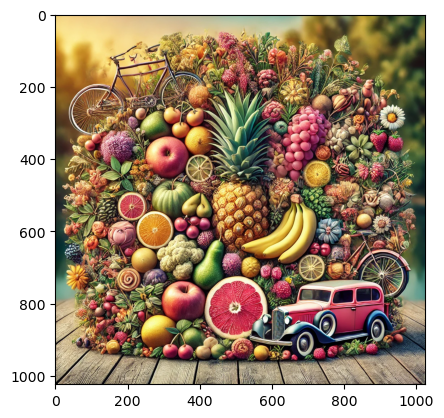

(1024, 1024, 3)
[119 206 240]


In [19]:
# Display the image (optional)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.show()

# Access pixel values
print(image.shape)  # Get image dimensions (height, width, channels)
print(image[0, 0])  # Access pixel value at (0, 0)

## Clustering:
We are going to try different clustering methods to see which methods is the best suited for such an image. 

### KMeans:

First we need to reshape the data into an array of colors so it's easier for the algorithm to recognize. 

In [35]:
image_flat = image.reshape(-1, 3)
image_flat[:5,:]

array([[119, 206, 240],
       [119, 206, 240],
       [119, 206, 240],
       [119, 206, 240],
       [119, 206, 240]], dtype=uint8)

let's first try 10 clusters as a base. Even though there seems to be a lot more than that. 

In [69]:
kmeans = KMeans(n_clusters=5, random_state=0).fit(image_flat)

In [71]:
image_flat2 = image_flat.copy()

# loops for each cluster center
for i in np.unique(kmeans.labels_):
    image_flat2[kmeans.labels_==i,:] = kmeans.cluster_centers_[i]

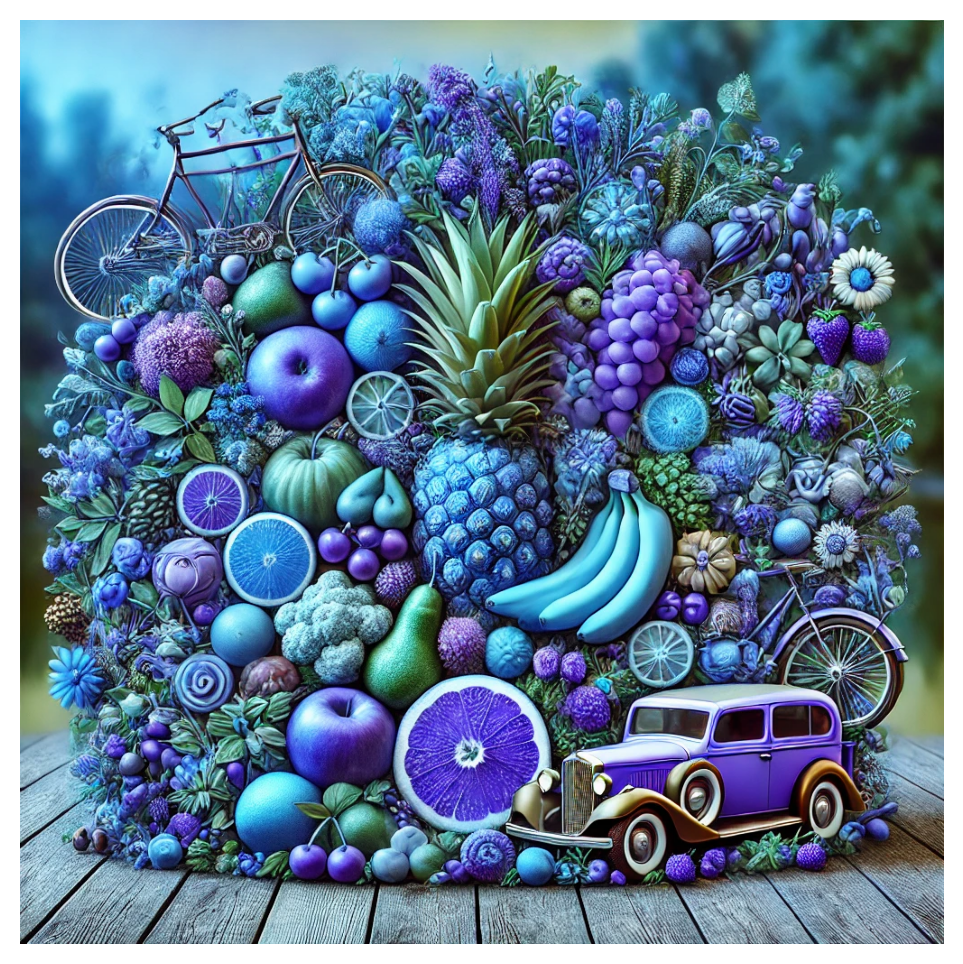

In [73]:
image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

plt.imshow(image2)
plt.axis('off');

5 is not enough. Let's try a bigger number. 

In [76]:
kmeans = KMeans(n_clusters=20, random_state=0).fit(image_flat)

In [78]:
image_flat2 = image_flat.copy()

# loops for each cluster center
for i in np.unique(kmeans.labels_):
    image_flat2[kmeans.labels_==i,:] = kmeans.cluster_centers_[i]

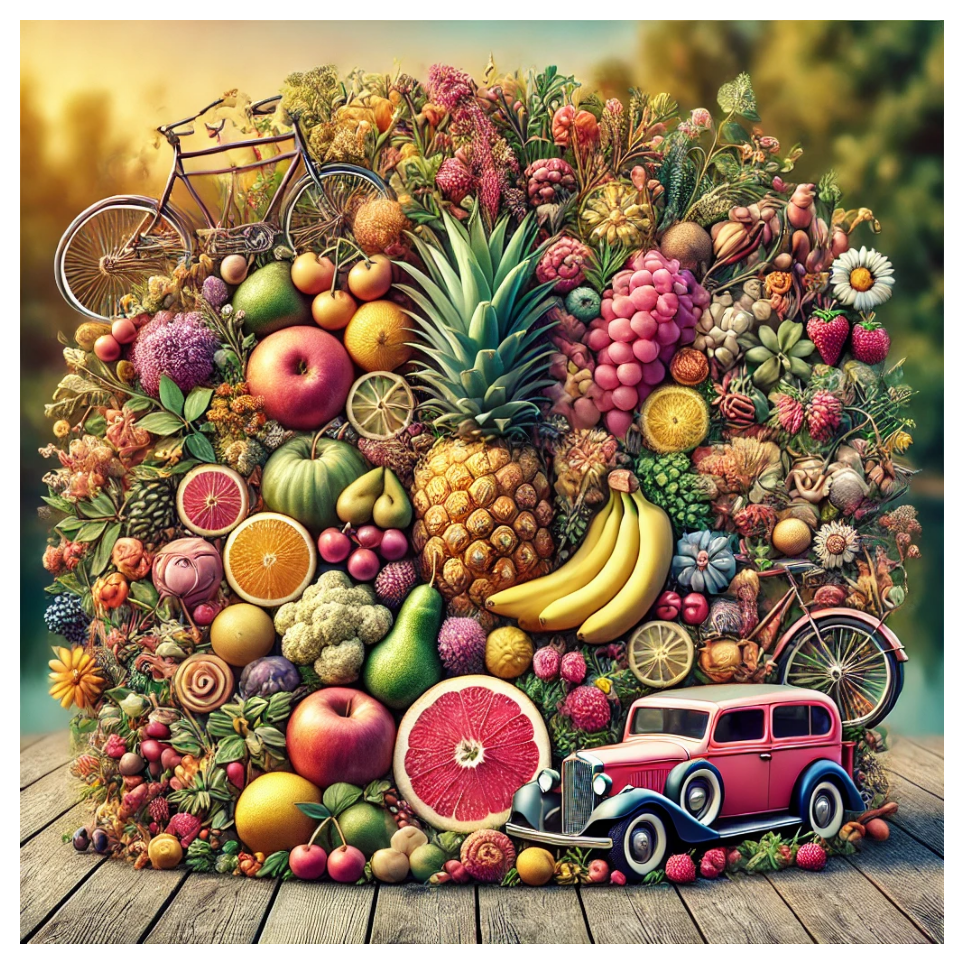

In [80]:
image2 = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image2)
plt.axis('off');

As we can see, the image classification seems to get better with increasing the classes. Let's see what an optimal number of clusters is based on an inertia curve.

In [85]:
def image_cluster(image, k):
    image_flat = image.reshape(image.shape[0]*image.shape[1],3)
    kmeans = KMeans(n_clusters=k, random_state=0).fit(image_flat)
    image_flat2 = image_flat.copy()

    # loops for each cluster center
    for i in np.unique(kmeans.labels_):
        image_flat2[kmeans.labels_==i,:] = kmeans.cluster_centers_[i]
        
    image2 = image_flat2.reshape(image.shape)
    return image2, kmeans.inertia_

In [109]:
k_vals = list(range(4,20,2))
image_list = []
inertia = []
for k in k_vals:
#    print(k)
    image2, ine = image_cluster(image,k)
    image_list.append(image2)
    inertia.append(ine)  

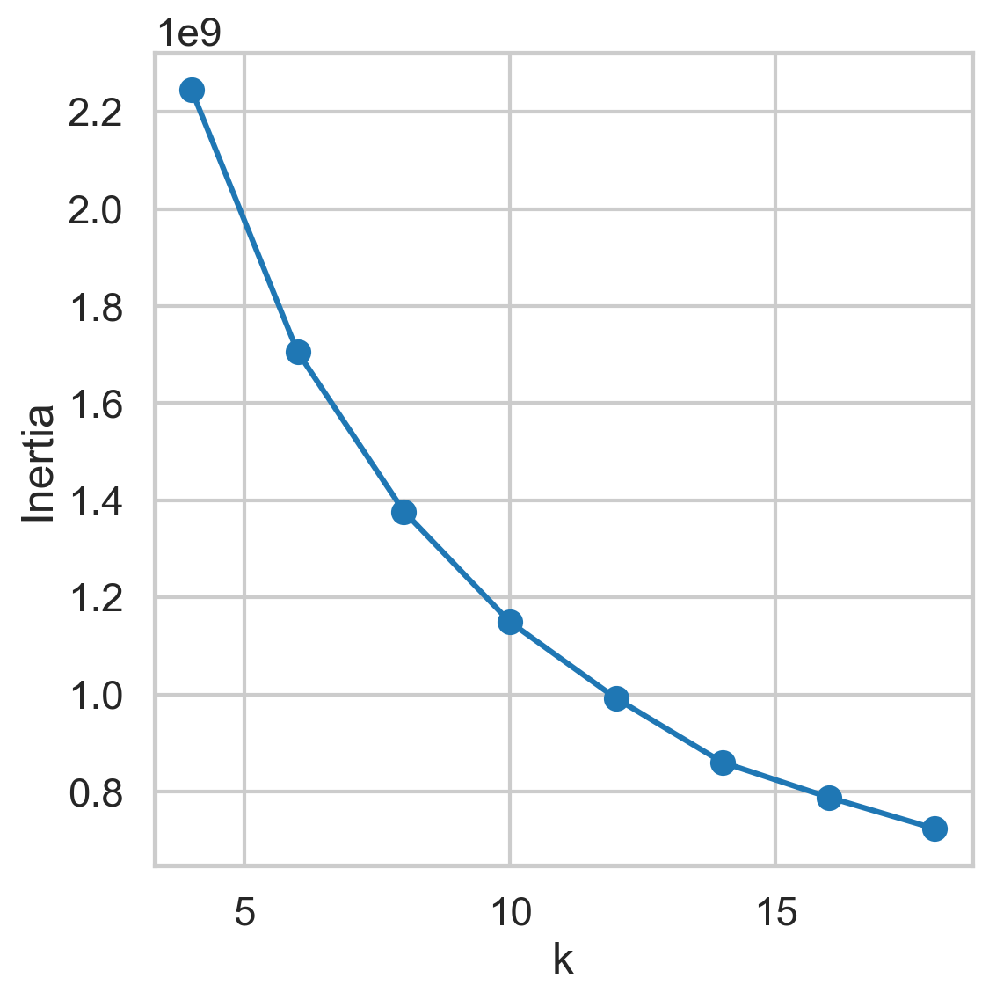

In [111]:
plt.plot(k_vals,inertia)
plt.scatter(k_vals,inertia)
plt.xlabel('k')
plt.ylabel('Inertia');

This elbow curve does not give us a clear picture of what the best number of clusters is. It could be around 10.  

One issue with Kmeans is that we have to specify the number of clusters. In an image like this one, we might not be so sure what the number of clusters are so we can try something like mean shift clustering.

### Mean Shift:

In [121]:
bandwidth = estimate_bandwidth(image_flat, quantile=.06, n_samples=3000)
bandwidth 

37.61945002244754

In [236]:
ms = MeanShift(bandwidth=bandwidth,bin_seeding=True)

In [238]:
ms.fit(image_flat)

MeanShift(bandwidth=37.61945002244754, bin_seeding=True)

In [133]:
np.unique(ms.labels_)

array([0, 1, 2, 3], dtype=int64)

We can see that the mean shift cluster has given us 4 clusters. This is far less than the kmeans classification. 
Let's see how well it performed based on clusters. 

In [139]:
cluster_int8=np.uint8(ms.cluster_centers_)
cluster_int8

array([[ 30,  39,  44],
       [149, 192, 210],
       [ 75,  59, 182],
       [199, 166,  93]], dtype=uint8)

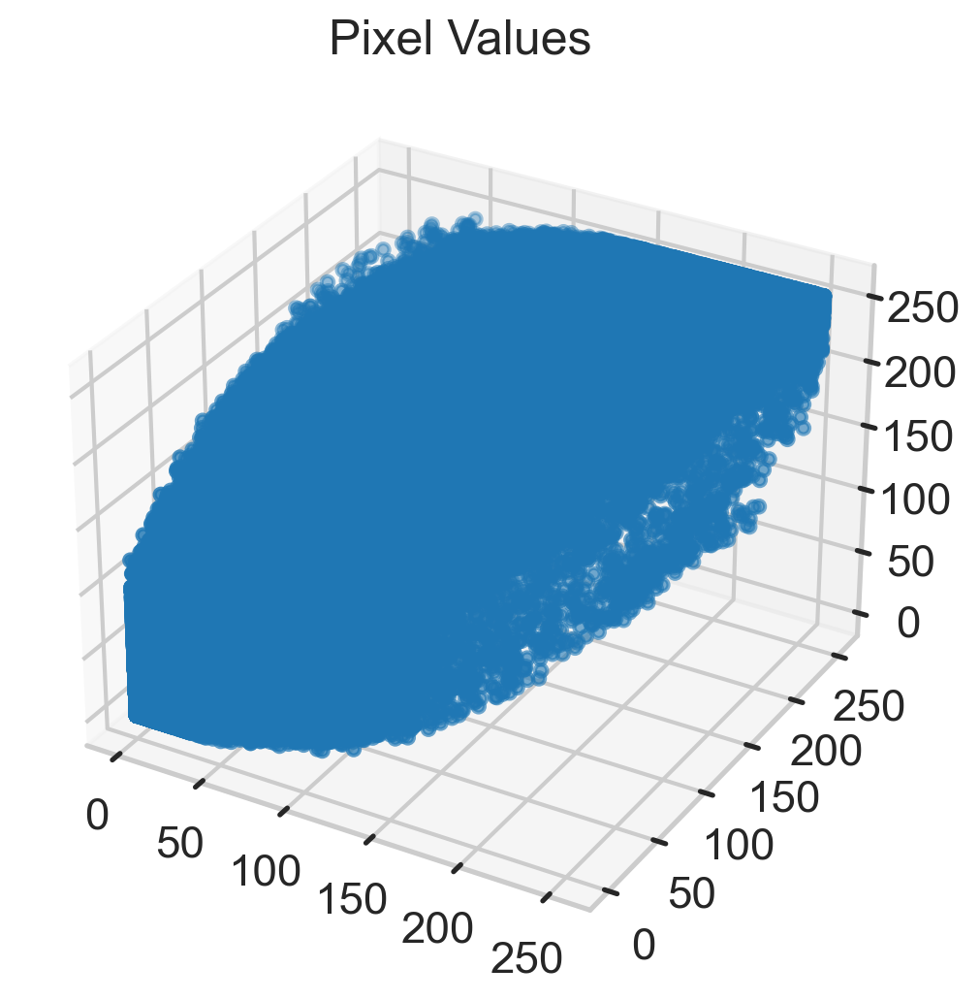

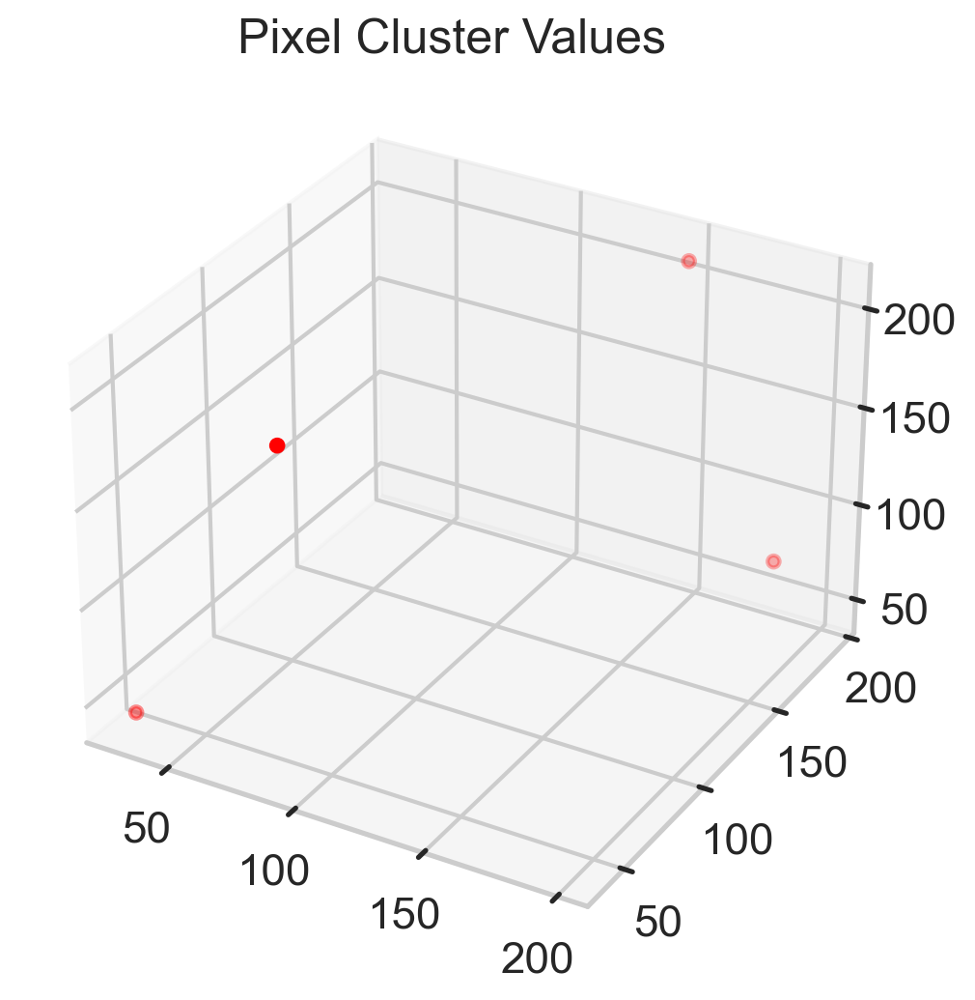

In [145]:
ax = plt.axes(projection ="3d")
ax.scatter3D(image[:,:,0],image[:,:,1],image[:,:,2])
ax.set_title('Pixel Values ')
plt.show()

ax = plt.axes(projection ="3d")
ax.set_title('Pixel Cluster Values  ')
ax.scatter3D(cluster_int8[:,0],cluster_int8[:,1],cluster_int8[:,2],color='red')
plt.show()

As we can see, teh ipxel values are all over the place, and the 4 clusters do not seem to account for all the pixels. But let's take a look at the iamge by assigning each data points to a cluster value. 

In [150]:
labeled=ms.labels_

result=np.zeros(image_flat.shape,dtype=np.uint8)

for label in np.unique(labeled):
    result[labeled==label,:]=cluster_int8[label,:]    
    

result=result.reshape(image.shape)

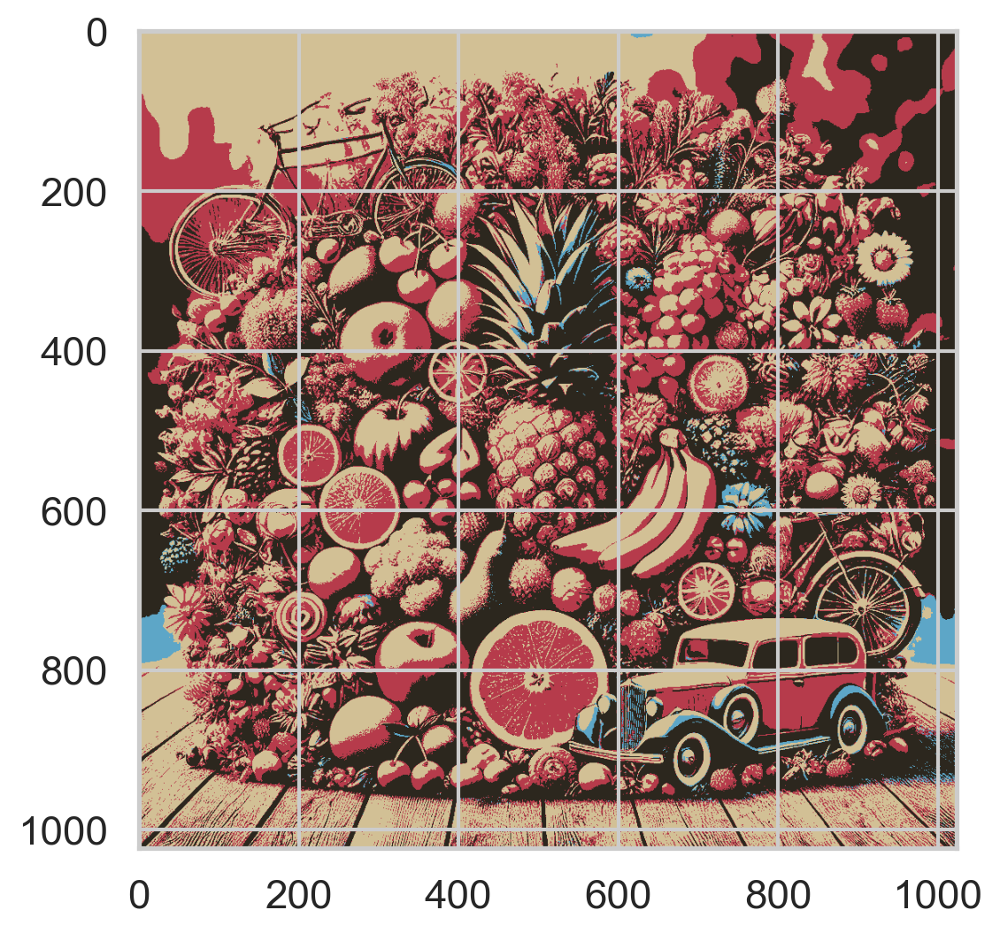

In [154]:
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.show()

This is the final result of our mean shift clustering algorithm. We can see that Kmeans definitely performed better in terms of clustering since it allowed us to choose the number fo clusters. 

Let's see if we can find an algorithm that performs better than Kmeans. Let's now try DBSCAN.

### DBSCAN:

In [174]:
height, width, channels = image.shape

In [176]:
x, y = np.meshgrid(np.arange(width), np.arange(height))
spatial_features = np.stack((x.ravel(), y.ravel()), axis=1)
features = np.hstack((image_flat, spatial_features)) 

In [198]:
eps = 10  # Maximum distance for a neighborhood
min_samples = 5  # Minimum points to form a cluster
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
labels = dbscan.fit_predict(features)

In [200]:
# Handle noise (label = -1)
unique_labels = np.unique(labels)
output_image = np.zeros_like(image)
for label in unique_labels:
    if label == -1:  # Noise
        color = [0, 0, 0]  # Black for noise
    else:
        color = np.random.randint(0, 256, size=3)  # Random color for each cluster
    output_image[labels.reshape(height, width) == label] = color


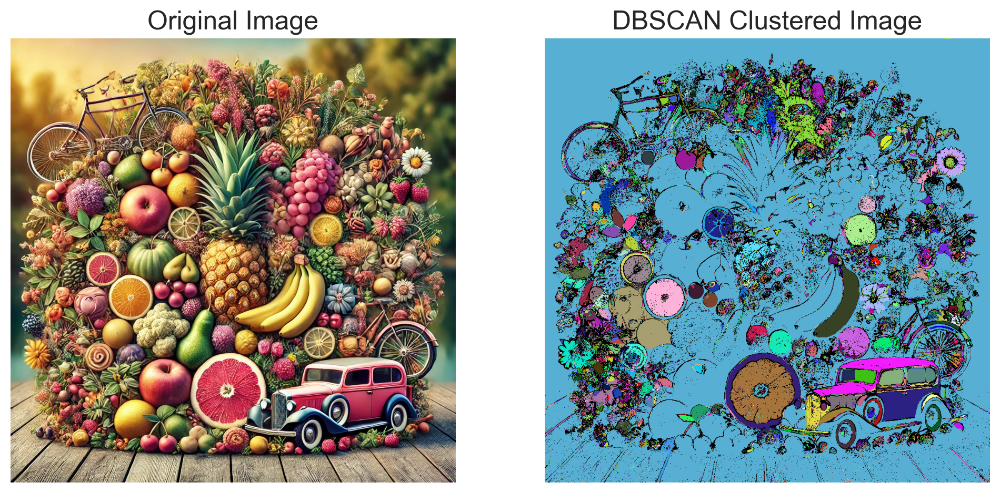

In [202]:
# Plot the original and clustered images
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB))
plt.title("DBSCAN Clustered Image")
plt.axis("off")

plt.show()

let's try to find an ideal set of parameters for DBSCAN. 

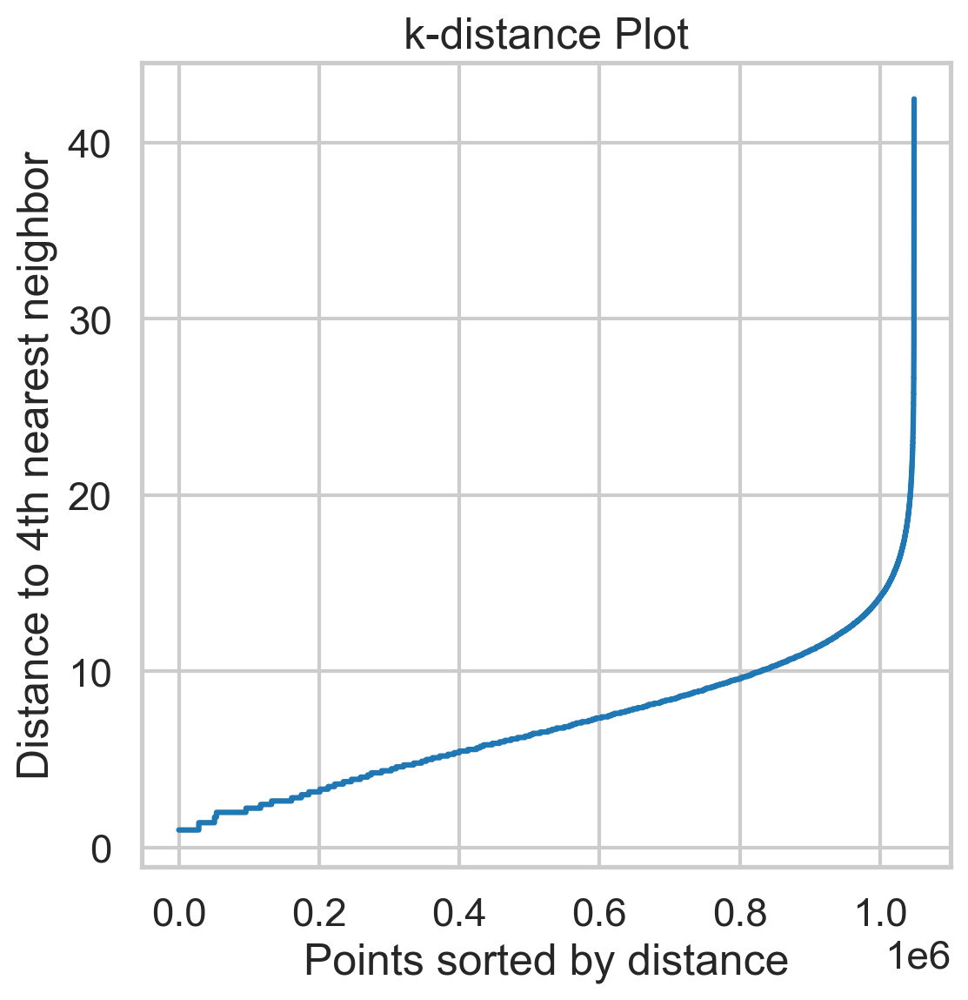

In [207]:
neighbors = NearestNeighbors(n_neighbors=4)  # Set k = 4, you can experiment with other values
neighbors.fit(features)  # `features` is the feature matrix (RGB + spatial)

distances, indices = neighbors.kneighbors(features)

# Calculate the distance to the 4th nearest neighbor for each point
distances = np.sort(distances[:, 3], axis=0)  # Use the distance to the 4th neighbor
plt.plot(distances)
plt.title("k-distance Plot")
plt.xlabel("Points sorted by distance")
plt.ylabel("Distance to 4th nearest neighbor")
plt.show()

If we look closesly, it seems the ideal value for eps is around 10 or less than that. 
We've tried 10 so let's try something lower. 

In [216]:
eps = 5  # Maximum distance for a neighborhood
min_samples = 4  # Minimum points to form a cluster
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
labels = dbscan.fit_predict(features)

In [218]:
# Handle noise (label = -1)
unique_labels = np.unique(labels)
output_image = np.zeros_like(image)
for label in unique_labels:
    if label == -1:  # Noise
        color = [0, 0, 0]  # Black for noise
    else:
        color = np.random.randint(0, 256, size=3)  # Random color for each cluster
    output_image[labels.reshape(height, width) == label] = color

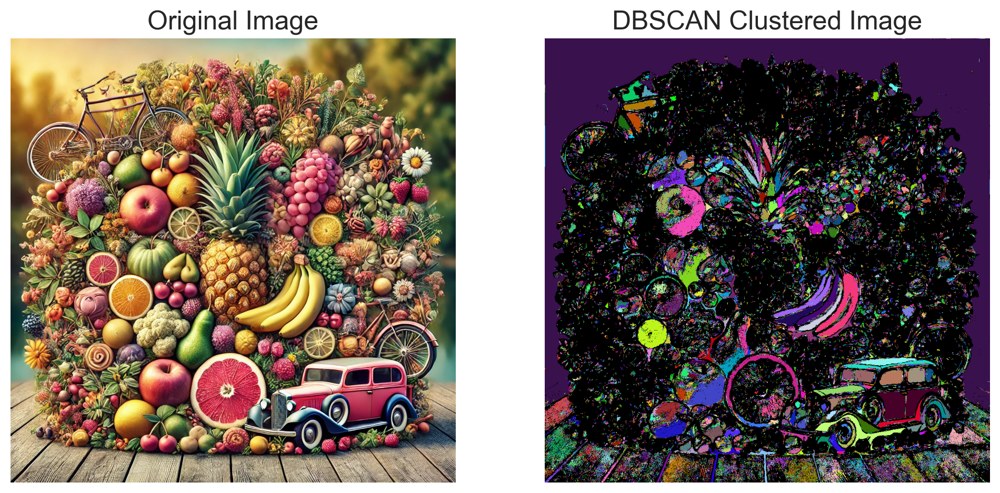

In [220]:
# Plot the original and clustered images
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB))
plt.title("DBSCAN Clustered Image")
plt.axis("off")

plt.show()

As we can see, it is quite difficult to determine the best parameters for clustering this image. We can say this algorithm has the most poor performance. 

## Conclusion: 
Based on the three algorithms, we can say for sure that Kmeans is the best algorithm for clustering such complex, colorful images. 
After we looked at the pixel grid, we saw that the pixels were indeed in a spherical shape and Kmeans is teh best algorithm for spherical cluster shapes. Due to the complexity of the image processing, Kmeans was the smoothest and simplest image processing method. 
We can come to the conclusion that sometimes the most simple and efficient algorithms are the best ones for complex problems. 